# CS445: Computational Photography
## Programming Project 4: Image-Based Lighting


## Recovering HDR Radiance Maps 

Load libraries and data

In [2]:
# jupyter extension that allows reloading functions from imports without clearing kernel :D
%load_ext autoreload
%autoreload 2

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
# System imports
from os import path
import math

# Third-Party Imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

# modify to where you store your project data including utils
datadir = "C:/Users/tahaw/Downloads/cs445_proj4/proj4" 

utilfn = datadir + "utils"
!cp -r "$utilfn" .
samplesfn = datadir + "samples"
!cp -r "$samplesfn" .

# can change this to your output directory of choice
!mkdir "images"
!mkdir "images/outputs"

# import starter code
import utils
from utils.io import read_image, write_image, read_hdr_image, write_hdr_image
from utils.display import display_images_linear_rescale, rescale_images_linear
from utils.hdr_helpers import gsolve
from utils.hdr_helpers import get_equirectangular_image
from utils.bilateral_filter import bilateral_filter



'cp' is not recognized as an internal or external command,
operable program or batch file.
'cp' is not recognized as an internal or external command,
operable program or batch file.
A subdirectory or file images already exists.
A subdirectory or file images/outputs already exists.


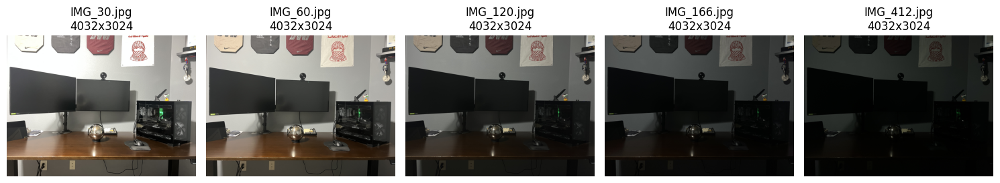

In [5]:
import os
from PIL import Image
import matplotlib.pyplot as plt


sample_dir = os.path.join(datadir, 'samples')
filenames = ['IMG_30.jpg', 'IMG_60.jpg', 'IMG_120.jpg', 'IMG_166.jpg', 'IMG_412.jpg']

# Load images and get sizes
images = []
sizes = []

for fname in filenames:
    path = os.path.join(sample_dir, fname)
    img = Image.open(path)
    images.append(img)
    sizes.append(img.size)  # (width, height)

# Display images with sizes
fig, axes = plt.subplots(1, len(images), figsize=(15, 5))
for i, ax in enumerate(axes):
    ax.imshow(images[i])
    ax.set_title(f"{filenames[i]}\n{sizes[i][0]}x{sizes[i][1]}")
    ax.axis('off')
plt.tight_layout()
plt.show()

In [6]:
from matplotlib.widgets import RectangleSelector
import matplotlib.pyplot as plt
%matplotlib tk


# This will store the crop box
crop_coords = []

def line_select_callback(eclick, erelease):
    # Get click and release coordinates
    x1, y1 = int(eclick.xdata), int(eclick.ydata)
    x2, y2 = int(erelease.xdata), int(erelease.ydata)
    
    # Convert to crop box format: (left, upper, right, lower)
    crop_coords.clear()
    crop_coords.extend([min(x1, x2), min(y1, y2), max(x1, x2), max(y1, y2)])
    print(f"Crop box: {crop_coords}")

def toggle_selector(event):
    # Press 'q' to exit
    if event.key == 'q':
        plt.close()

# Display the first image to draw crop on
fig, ax = plt.subplots()
ax.imshow(images[0])
ax.set_title("Draw crop region, press 'q' when done")
toggle = RectangleSelector(ax, line_select_callback, useblit=True,
                           button=[1],  # left click only
                           minspanx=5, minspany=5,
                           spancoords='pixels',
                           interactive=True)
plt.connect('key_press_event', toggle_selector)
plt.show()


In [7]:
crop_coords = [1741, 1898, 2086, 2258]

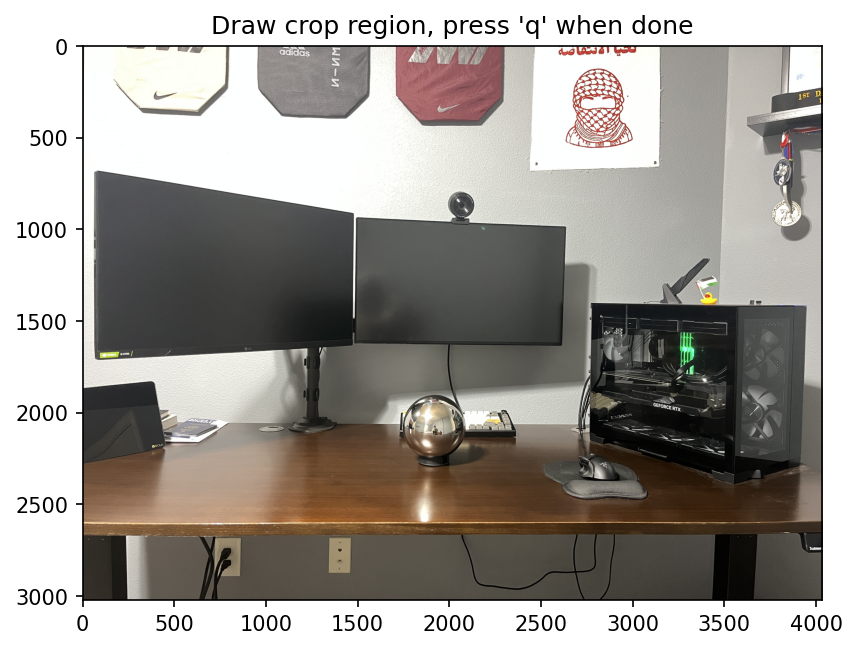

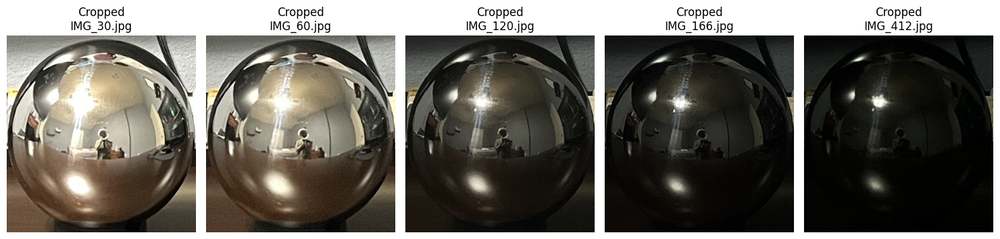

In [8]:
%matplotlib inline


# Convert base crop box
base_crop_box = tuple(crop_coords)

# Optional pixel offset
offset = 12  # you can tune this visually

# Apply the crop to all images (adjusting only a few)
cropped_images = []
for i, img in enumerate(images):
    filename = filenames[i]
    
    if filename in ['IMG_60.jpg', 'IMG_412.jpg']:
        # Shift crop box down by `offset` pixels
        left, upper, right, lower = base_crop_box
        adjusted_crop_box = (left, upper + offset, right, lower + offset)
        cropped = img.crop(adjusted_crop_box)
    else:
        cropped = img.crop(base_crop_box)
    
    cropped_images.append(cropped)

# Display cropped images
fig, axes = plt.subplots(1, len(cropped_images), figsize=(15, 5))
for i, ax in enumerate(axes):
    ax.imshow(cropped_images[i])
    ax.set_title(f"Cropped\n{filenames[i]}")
    ax.axis('off')
plt.tight_layout()
plt.show()


In [9]:
# Directory to save cropped images
output_dir = os.path.join(sample_dir)
os.makedirs(output_dir, exist_ok=True)

# Save cropped images with a new prefix
for i, img in enumerate(cropped_images):
    filename = os.path.splitext(filenames[i])[0]
    save_path = os.path.join(output_dir, f"{filename}_cropped.jpg")
    img.save(save_path)
    print(f"Saved: {save_path}")

Saved: C:/Users/tahaw/Downloads/cs445_proj4/proj4\samples\IMG_30_cropped.jpg
Saved: C:/Users/tahaw/Downloads/cs445_proj4/proj4\samples\IMG_60_cropped.jpg
Saved: C:/Users/tahaw/Downloads/cs445_proj4/proj4\samples\IMG_120_cropped.jpg
Saved: C:/Users/tahaw/Downloads/cs445_proj4/proj4\samples\IMG_166_cropped.jpg
Saved: C:/Users/tahaw/Downloads/cs445_proj4/proj4\samples\IMG_412_cropped.jpg


### Reading LDR images

You can use the provided samples or your own images.  You get more points for using your own images, but it might help to get things working first with the provided samples.

In [10]:
# TODO: Replace this with your path and files

imdir = 'samples'
# imfns = ['0024.jpg', '0060.jpg', '0120.jpg', '0205.jpg', '0553.jpg']
# exposure_times = [1/24.0, 1/60.0, 1/120.0, 1/205.0, 1/553.0]
#My Images:
imfns = ['IMG_30_cropped.jpg', 'IMG_60_cropped.jpg', 'IMG_120_cropped.jpg', 'IMG_166_cropped.jpg', 'IMG_412_cropped.jpg']
exposure_times = [1/30.0, 1/60.0, 1/120.0, 1/166.0, 1/412.0]

ldr_images = []
for f in np.arange(len(imfns)):
  im = read_image(imdir + '/' + imfns[f])
  if f==0:
    imsize = int((im.shape[0] + im.shape[1])/2) # set width/height of ball images
    ldr_images = np.zeros((len(imfns), imsize, imsize, 3))
  ldr_images[f] = cv2.resize(im, (imsize, imsize))

background_image_file = imdir + '/' + 'IMG_0955.jpg'
background_image = read_image(background_image_file)



### Naive LDR merging 

Compute the HDR image as average of irradiance estimates from LDR images

In [11]:
def make_hdr_naive(ldr_images: np.ndarray, exposures: list) -> (np.ndarray, np.ndarray):
    '''
    Makes HDR image using multiple LDR images, and its corresponding exposure values.
    
    The steps to implement:
    1) Divide each image by its exposure time.
        - This will rescale images as if it has been exposed for 1 second.
    
    2) Return average of above images
    
    
    For further explanation, please refer to problem page for how to do it.
      
    Args:
        ldr_images(np.ndarray): N x H x W x 3  shaped numpy array representing
            N ldr images with width W, height H, and channel size of 3 (RGB)
        exposures(list): list of length N, representing exposures of each images.
            Each exposure should correspond to LDR images' exposure value.
    Return:
        (np.ndarray): H x W x 3 shaped numpy array representing HDR image merged using
            naive ldr merging implementation.
        (np.ndarray): N x H x W x 3  shaped numpy array represending log irradiances
            for each exposures
            
    '''
    N, H, W, C = ldr_images.shape
    # sanity check
    assert N == len(exposures)
  
    # TO DO

    exposures = np.array(exposures).reshape(N, 1, 1, 1)  # reshape for broadcasting
    epsilon = 1e-6  # to prevent division by zero

    # Step 1: Divide each image by exposure
    normalized = ldr_images.astype(np.float32) / exposures

    # Step 2: Compute average to get HDR image
    hdr_image = np.mean(normalized, axis=0)

    # Step 3: Compute log irradiance for each image
    log_irradiances = np.log(normalized + epsilon)

    print(hdr_image.shape)


  
    return hdr_image, log_irradiances



In [12]:
def display_hdr_image(im_hdr):
    '''
    Maps the HDR intensities into a 0 to 1 range and then displays. 
    Three suggestions to try: 
      (1) Take log and then linearly map to 0 to 1 range (see display.py for example) 
      (2) img_out = im_hdr / (1 + im_hdr)
      (3) HDR display code in a python package 
    '''

    # TO DO
    tonemap = cv2.createTonemapReinhard(gamma=1.5)
    ldr = tonemap.process(im_hdr.astype(np.float32))

    plt.imshow(np.clip(ldr, 0, 1))

(352, 352, 3)
HDR Image


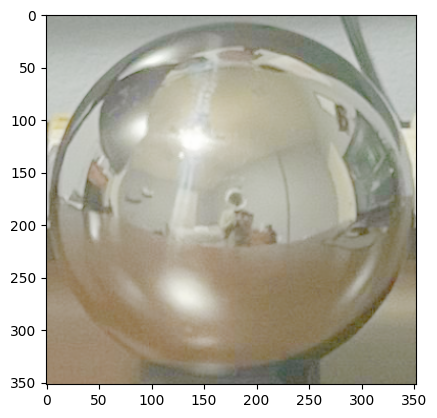

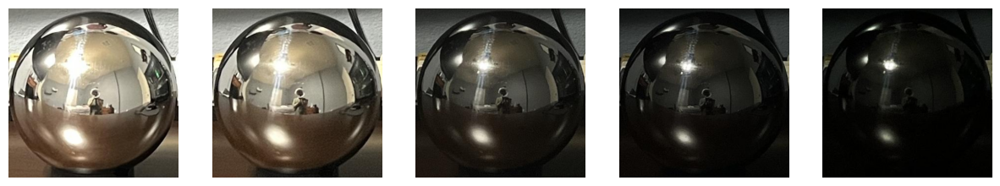

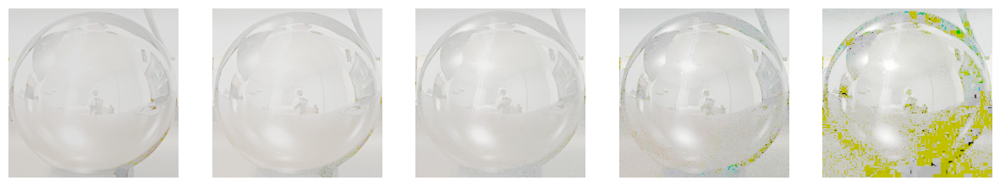

In [13]:

# get HDR image, log irradiance
naive_hdr_image, naive_log_irradiances = make_hdr_naive(ldr_images, exposure_times)

# write HDR image to directory
write_hdr_image(naive_hdr_image, 'images/outputs/naive_hdr.hdr')

# display HDR image
print('HDR Image')
display_hdr_image(naive_hdr_image)

# display original images (code provided in utils.display)
display_images_linear_rescale(ldr_images)

# display log irradiance image (code provided in utils.display)
display_images_linear_rescale(naive_log_irradiances)


### Weighted LDR merging 

Compute HDR image as a weighted average of irradiance estimates from LDR images, where weight is based on pixel intensity so that very low/high intensities get less weight


In [14]:
def make_hdr_weighted(ldr_images: np.ndarray, exposure_times: list) -> (np.ndarray, np.ndarray):
    '''
    Makes HDR image using multiple LDR images, and its corresponding exposure values.
    
    The steps to implement:
    1) compute weights for images with based on intensities for each exposures
        - This can be a binary mask to exclude low / high intensity values

    2) Divide each images by its exposure time.
        - This will rescale images as if it has been exposed for 1 second.
    
    3) Return weighted average of above images
    
    
    Args:
        ldr_images(np.ndarray): N x H x W x 3 shaped numpy array representing
            N ldr images with width W, height H, and channel size of 3 (RGB)
        exposure_times(list): list of length N, representing exposures of each images.
            Each exposure should correspond to LDR images' exposure value.
    Return:
        (np.ndarray): H x W x 3 shaped numpy array representing HDR image merged without
            under - over exposed regions

    '''
    N, H, W, C = ldr_images.shape
    # sanity check
    assert N == len(exposure_times)
    
    # TO DO

    exposures = np.array(exposure_times, dtype=np.float32).reshape(N, 1, 1, 1)
    epsilon = 1e-6
    
    ldr_255 = ldr_images * 255.0

    # Weighting function: w(z) = 128 - |z - 128|
    weights = 128.0 - np.abs(ldr_255  - 128.0)  # shape: (N, H, W, 3)
    weights = np.clip(weights, 0, 128)  # just in case, stay in valid range

    # Estimate irradiance by dividing each image by its exposure
    irradiance = ldr_images.astype(np.float32) / (exposures + epsilon)

    # Weighted average
    weighted_sum = (weights * irradiance).sum(axis=0)
    weight_sum = weights.sum(axis=0)

    hdr_image = weighted_sum / (weight_sum + epsilon)

    return hdr_image



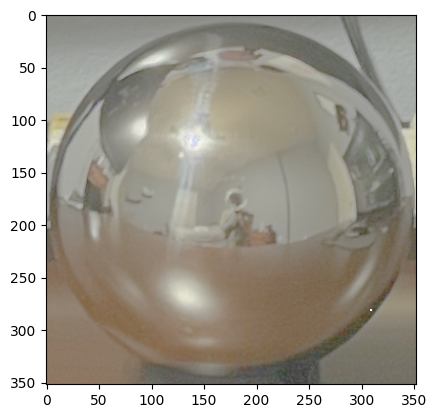

In [15]:
# get HDR image, log irradiance
weighted_hdr_image = make_hdr_weighted(ldr_images, exposure_times)

# write HDR image to directory
write_hdr_image(weighted_hdr_image, 'images/outputs/weighted_hdr.hdr')

# display HDR image
display_hdr_image(weighted_hdr_image)


Display of difference between naive and weighted for your own inspection

Where does the weighting make a big difference increasing or decreasing the irradiance estimate?  Think about why.

Min ratio =  0.7721957611621841   Max ratio =  4.999698795272466


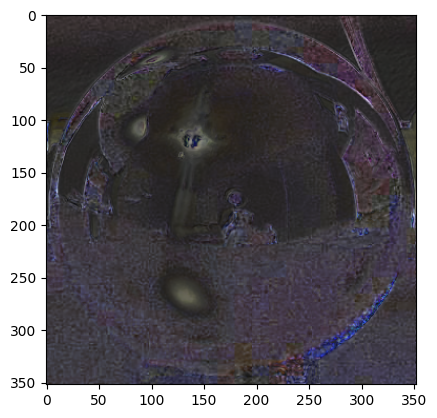

In [16]:
# display difference between naive and weighted 

log_diff_im = np.log(weighted_hdr_image)-np.log(naive_hdr_image)
print('Min ratio = ', np.exp(log_diff_im).min(), '  Max ratio = ', np.exp(log_diff_im).max())
plt.figure()
plt.imshow(rescale_images_linear(log_diff_im))

### LDR merging with camera response function estimation 

Compute HDR after calibrating the photometric reponses to obtain more accurate irradiance estimates from each image

Some suggestions on using <tt>gsolve</tt>:
<ul>
	<li>When providing input to gsolve, don't use all available pixels, otherwise you will likely run out of memory / have very slow run times. To overcome, just randomly sample a set of pixels (1000 or so can suffice), but make sure all pixel locations are the same for each exposure.</li>
	<li>The weighting function w should be implemented using Eq. 4 from the paper (this is the same function that can be used for the previous LDR merging method).</li>
	<li>Try different lambda values for recovering <i>g</i>. Try lambda=1 initially, then solve for <i>g</i> and plot it. It should be smooth and continuously increasing. If lambda is too small, g will be bumpy.</li>
	<li>Refer to Eq. 6 in the paper for using g and combining all of your exposures into a final image. Note that this produces log irradiance values, so make sure to exponentiate the result and save irradiance in linear scale.</li>
</ul>

In [17]:
import random

In [18]:
def gsolve(Z, B, l, w):
    """
    Solve for imaging response function g(z) and log irradiance E_i.

    Parameters:
    - Z: N x P matrix of pixel values (N images, P sampled pixels)
    - B: log shutter speeds (N,)
    - l: lambda, smoothness constraint
    - w: weighting function, e.g. w = lambda z: min(z, 255 - z)

    Returns:
    - g: 256x1 vector mapping pixel value to log exposure
    - lE: log irradiance for each sample
    """
    n = 256  # possible pixel values (0-255)
    N, P = Z.shape

    A = np.zeros((N * P + n - 2 + 1, n + P), dtype=np.float32)
    b = np.zeros((A.shape[0], 1), dtype=np.float32)

    k = 0
    for i in range(N):
        for j in range(P):
            z = Z[i, j]
            wij = w(z)
            A[k, z] = wij
            A[k, n + j] = -wij
            b[k, 0] = wij * B[i]
            k += 1

    # Fix the curve by setting its middle value to 0
    A[k, 127] = 1
    k += 1

    # Smoothness equations
    for z in range(1, n - 1):
        w_z = w(z)
        A[k, z - 1] = l * w_z
        A[k, z] = -2 * l * w_z
        A[k, z + 1] = l * w_z
        k += 1

    # Solve the system
    x = np.linalg.lstsq(A, b, rcond=None)[0]

    g = x[0:n].flatten()
    lE = x[n:].flatten()

    return g, lE


def weighting_func(z):
    # Eq. 4 triangular weight
    z = np.asarray(z)
    return np.where(z <= 127, z, 255 - z)


In [19]:
from scipy.ndimage import median_filter

def make_hdr_estimation(ldr_images: np.ndarray, exposure_times: list, lm)-> (np.ndarray, np.ndarray):
    '''
    Makes HDR image using multiple LDR images, and its corresponding exposure values.
    Please refer to problem notebook for how to do it.
    
    **IMPORTANT**
    The gsolve operations should be ran with:
        Z: int64 array of shape N x P, where N = number of images, P = number of pixels
        B: float32 array of shape N, log shutter times
        l: lambda; float to control amount of smoothing
        w: function that maps from float intensity to weight  
    The steps to implement:
    1) Create random points to sample (from mirror ball region)
    2) For each exposures, compute g values using samples
    3) Recover HDR image using g values
    

    Args:
        ldr_images(np.ndarray): N x H x W x 3 shaped numpy array representing
            N ldr images with width W, height H, and channel size of 3 (RGB)
        exposures(list): list of length N, representing exposures of each images.
            Each exposure should correspond to LDR images' exposure value.
        lm (scalar): the smoothing parameter
    Return:
        (np.ndarray): H x W x 3 shaped numpy array representing HDR image merged using
            gsolve
        (np.ndarray): N x H x W x 3 shaped numpy array represending log irradiances
            for each exposures
        (np.ndarray): 3 x 256 shaped numpy array represending g values of each pixel intensities
            at each channels (used for plotting)
    '''
    N, H, W, C = ldr_images.shape
    assert N == len(exposure_times)

    # Step 1: Sample random pixels for gsolve
    num_samples = 1000
    np.random.seed(0)
    sample_indices = random.sample(range(H * W), num_samples)
    row_inds = np.array(sample_indices) // W
    col_inds = np.array(sample_indices) % W

    # Step 2: Setup
    B = np.log(np.array(exposure_times, dtype=np.float32))  # log shutter times
    g_channels = np.zeros((3, 256), dtype=np.float32)
    log_irradiances = np.zeros((N, H, W, 3), dtype=np.float32)
    weight_maps = np.zeros((N, H, W, 3), dtype=np.float32)

    for ch in range(3):  # for each RGB channel
        # Gather sample intensities for gsolve
        Z = np.zeros((N, num_samples), dtype=np.int64)
        for i in range(N):
            img = ldr_images[i, :, :, ch]
            Z[i] = (img[row_inds, col_inds] * 255).astype(np.int64)

        # Solve for g and log irradiance
        g, _ = gsolve(Z, B, lm, weighting_func)
        g_channels[ch] = g

        # Recover full-image log irradiance using g
        for i in range(N):
            Z_full = (ldr_images[i, :, :, ch] * 255).astype(np.int64)
            Z_full = np.clip(Z_full, 0, 255)

            w = weighting_func(Z_full)
            weight_maps[i, :, :, ch] = w
            g_z = g[Z_full]

            # Only use valid weights
            valid_mask = w > 0
            log_E = np.zeros_like(Z_full, dtype=np.float32)
            log_E[valid_mask] = (w[valid_mask] * (g_z[valid_mask] - B[i])) / (w[valid_mask])
            log_E = np.nan_to_num(log_E, nan=0.0, posinf=0.0, neginf=0.0)

            # Optional: apply median filter to suppress hot pixels
            log_irradiances[i, :, :, ch] = median_filter(log_E, size=3)

    # Step 3: Create shared valid mask across RGB channels
    shared_valid_mask = np.all(weight_maps > 0, axis=3)  # (N, H, W)
    shared_valid_mask = shared_valid_mask[..., np.newaxis]  # (N, H, W, 1)

    # Step 4: Compute robust average of log irradiances (only valid pixels)
    valid_log_irradiances = log_irradiances * shared_valid_mask
    valid_counts = np.sum(shared_valid_mask, axis=0).astype(np.float32)  # (H, W, 1)
    valid_counts = np.clip(valid_counts, 1, N)

    log_irradiance_avg = np.sum(valid_log_irradiances, axis=0) / valid_counts
    hdr_image = np.exp(log_irradiance_avg)

    # Step 5: Clip HDR for tone mapping safety
    hdr_image = np.clip(hdr_image, 0, np.percentile(hdr_image, 99))

    return hdr_image, log_irradiances, g_channels



In [20]:
def suppress_hot_pixels(hdr_image, threshold=0.99, filter_size=3):
    """
    Detect and suppress overly bright pixels using a median filter.
    Args:
        hdr_image (np.ndarray): H x W x 3 HDR image
        threshold (float): intensity percentile to detect hot pixels
        filter_size (int): size of median filter kernel
    Returns:
        np.ndarray: cleaned HDR image
    """
    cleaned = np.copy(hdr_image)
    bright_mask = np.any(hdr_image > np.percentile(hdr_image, threshold * 100), axis=-1)

    for c in range(3):
        channel = hdr_image[:, :, c]
        median_c = median_filter(channel, size=filter_size)
        channel[bright_mask] = median_c[bright_mask]
        cleaned[:, :, c] = channel

    return cleaned

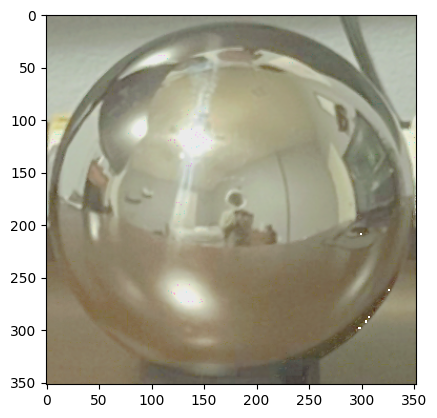

In [21]:
lm = 5
# get HDR image, log irradiance
calib_hdr_image, calib_log_irradiances, g = make_hdr_estimation(ldr_images, exposure_times, lm)

# write HDR image to directory
write_hdr_image(calib_hdr_image, 'images/outputs/calib_hdr.hdr')

# display HDR image
display_hdr_image(calib_hdr_image)


In [22]:
def find_bright_pixels(img, value=255, tolerance=1):
    """
    Finds pixels in the bottom-right quarter of the image that are near the target value.
    
    Args:
        img (np.ndarray): H x W x C image
        value (float or list): target value to search for (255 for bright pixels)
        tolerance (float): how close pixel values should be to `value`
        
    Returns:
        mask (np.ndarray): boolean mask of same shape (H, W), True for matched pixels
        coords (np.ndarray): list of (row, col) coordinates where match occurs
    """
    H, W, _ = img.shape
    quarter_img = img[H//2:, W//2:, :]  # bottom-right quarter

    if isinstance(value, (list, tuple, np.ndarray)):
        value = np.array(value)
        mask = np.all(np.abs(quarter_img - value) < tolerance, axis=-1)
    else:
        mask = np.any(np.abs(quarter_img - value) < tolerance, axis=-1)

    # Get coordinates relative to full image
    coords = np.argwhere(mask)
    coords[:, 0] += H // 2
    coords[:, 1] += W // 2

    return mask, coords


In [23]:
# Assuming hdr_image or tone-mapped image
mask, coords = find_bright_pixels(calib_hdr_image * 255, value=255, tolerance=70)

print(f"Found {len(coords)} bright pixels in bottom-right quarter.")
print("locations:", coords)


Found 12 bright pixels in bottom-right quarter.
locations: [[209 299]
 [262 326]
 [287 306]
 [288 306]
 [288 307]
 [290 305]
 [291 304]
 [292 304]
 [298 296]
 [298 297]
 [298 298]
 [301 294]]


In [24]:
import numpy as np

def fill_pixels_with_avg(hdr_image, coords, kernel_size=3):
    """
    Replace specified pixels with the average of their local neighborhood.

    """
    filled = np.copy(hdr_image)
    pad = kernel_size // 2
    padded = np.pad(hdr_image, ((pad, pad), (pad, pad), (0, 0)), mode='reflect')

    for (y, x) in coords:
        y_p, x_p = y + pad, x + pad  # account for padding
        neighborhood = padded[y_p - pad:y_p + pad + 1, x_p - pad:x_p + pad + 1, :]
        local_avg = np.mean(neighborhood, axis=(0, 1))
        filled[y, x] = local_avg

    return filled


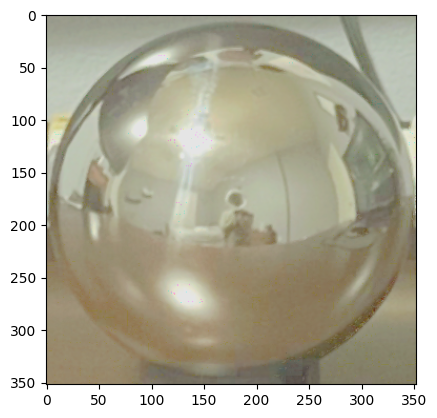

In [25]:
# coords already extracted from your bright pixel finder
calib_hdr_image = fill_pixels_with_avg(calib_hdr_image, coords)
display_hdr_image(calib_hdr_image)

The following code displays your results. You can copy the resulting images and plots directly into your report where appropriate.

Min ratio =  0.08715764266416037   Max ratio =  21.033294262095335


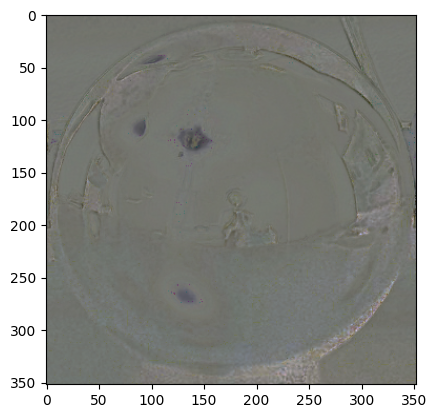

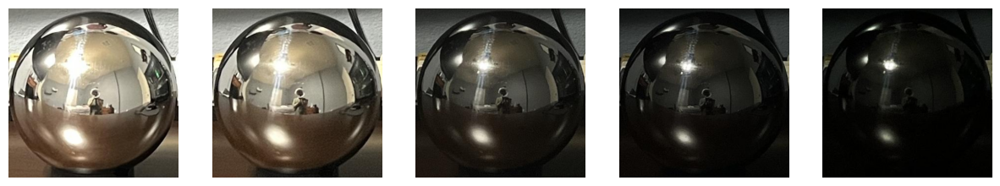

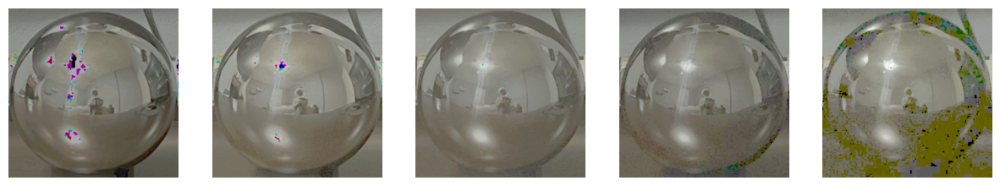

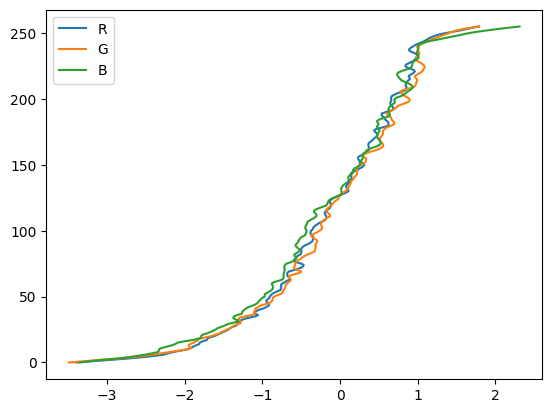

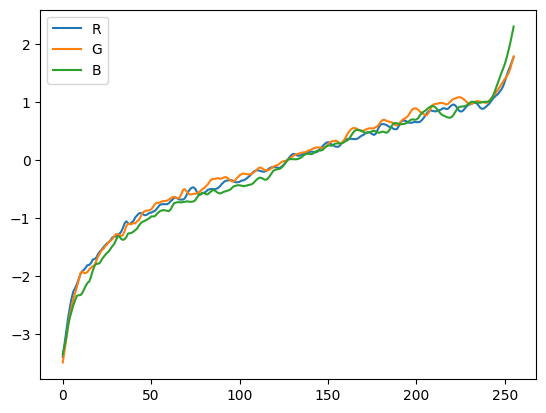

In [26]:
# display difference between calibrated and weighted
log_diff_im = np.log(calib_hdr_image/calib_hdr_image.mean())-np.log(weighted_hdr_image/weighted_hdr_image.mean())
print('Min ratio = ', np.exp(log_diff_im).min(), '  Max ratio = ', np.exp(log_diff_im).max())
plt.figure()
plt.imshow(rescale_images_linear(log_diff_im))

# display original images (code provided in utils.display)
display_images_linear_rescale(ldr_images)

# display log irradiance image (code provided in utils.display)
display_images_linear_rescale(calib_log_irradiances)

# plot g vs intensity, and then plot intensity vs g
N, NG = g.shape
labels = ['R', 'G', 'B']
plt.figure()
for n in range(N):
    plt.plot(g[n], range(NG), label=labels[n])
plt.gca().legend(('R', 'G', 'B'))

plt.figure()
for n in range(N):
    plt.plot(range(NG), g[n], label=labels[n])
plt.gca().legend(('R', 'G', 'B'))

naive:  	log range =  7.422 	avg RMS error =  0.306
weighted:	log range =  7.54 	avg RMS error =  0.294
calibrated:	log range =  5.079 	avg RMS error =  0.247


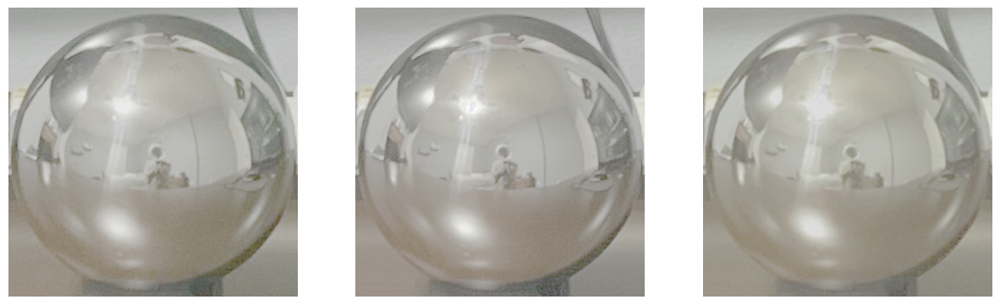

In [27]:
def weighted_log_error(ldr_images, hdr_image, log_irradiances):
  # computes weighted RMS error of log irradiances for each image compared to final log irradiance
  N, H, W, C = ldr_images.shape
  w = 1-abs(ldr_images - 0.5)*2
  err = 0
  for n in np.arange(N):
    err += np.sqrt(np.multiply(w[n], (log_irradiances[n]-np.log(hdr_image))**2).sum()/w[n].sum())/N 
  return err


# compare solutions
err = weighted_log_error(ldr_images, naive_hdr_image, naive_log_irradiances)
print('naive:  \tlog range = ', round(np.log(naive_hdr_image).max() - np.log(naive_hdr_image).min(),3), '\tavg RMS error = ', round(err,3))
err = weighted_log_error(ldr_images, weighted_hdr_image, naive_log_irradiances)
print('weighted:\tlog range = ', round(np.log(weighted_hdr_image).max() - np.log(weighted_hdr_image).min(),3), '\tavg RMS error = ', round(err,3))
err = weighted_log_error(ldr_images, calib_hdr_image, calib_log_irradiances)
print('calibrated:\tlog range = ', round(np.log(calib_hdr_image).max() - np.log(calib_hdr_image).min(),3), '\tavg RMS error = ', round(err,3))

# display log hdr images (code provided in utils.display)
display_images_linear_rescale(np.log(np.stack((naive_hdr_image/naive_hdr_image.mean(), weighted_hdr_image/weighted_hdr_image.mean(), calib_hdr_image/calib_hdr_image.mean()), axis=0)))

In [28]:
calib_hdr_image.shape

(352, 352, 3)

## Panoramic transformations 

Compute the equirectangular image from the mirrorball image

In [29]:
def panoramic_transform(hdr_image):
    '''
    Given HDR mirror ball image, 
    
    Expects mirror ball image to have center of the ball at center of the image, and
    width and height of the image to be equal.
    
    Steps to implement:
    1) Compute N image of normal vectors of mirror ball
    2) Compute R image of reflection vectors of mirror ball
    3) Map reflection vectors into spherical coordinates
    4) Interpolate spherical coordinate values into equirectangular grid.
    
    Steps 3 and 4 are implemented for you with get_equirectangular_image

    '''
    H, W, C = hdr_image.shape
    assert H == W
    assert C == 3

    # TO DO: compute N and R
        
    # R = V - 2 * dot(V,N) * N

    radius = H // 2
    cx, cy = W // 2, H // 2  # center of the image

    # Step 1: Compute N (normal vectors at each pixel)
    y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')
    nx = (x - cx) / radius
    ny = (y - cy) / radius
    mask = nx**2 + ny**2 <= 1  # only valid inside the sphere

    nz_squared = 1 - (nx**2 + ny**2)
    nz_squared = np.clip(nz_squared, 0, 1)
    nz = np.sqrt(nz_squared)

    N = np.stack([nx, ny, nz], axis=-1)  # shape H x W x 3
    N[~mask] = 0  # set background to 0

    # Step 2: Compute R = V - 2 * dot(V,N) * N, where V = [0, 0, -1]
    V = np.array([0, 0, -1])
    dotVN = np.sum(N * V, axis=-1, keepdims=True)  # H x W x 1
    R = V - 2 * dotVN * N  # reflect camera vector off surface normal
    R[~mask] = 0  # set background to 0

    # Optional: visualize normals and reflection directions
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.title("Surface Normals")
    plt.imshow((N + 1) / 2)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title("Reflection Vectors")
    plt.imshow((R + 1) / 2)
    plt.axis('off')
    plt.show()

    
    equirectangular_image = get_equirectangular_image(R, hdr_image)
    return equirectangular_image

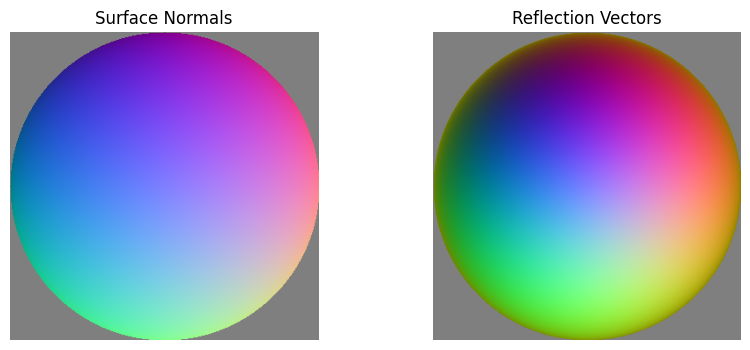

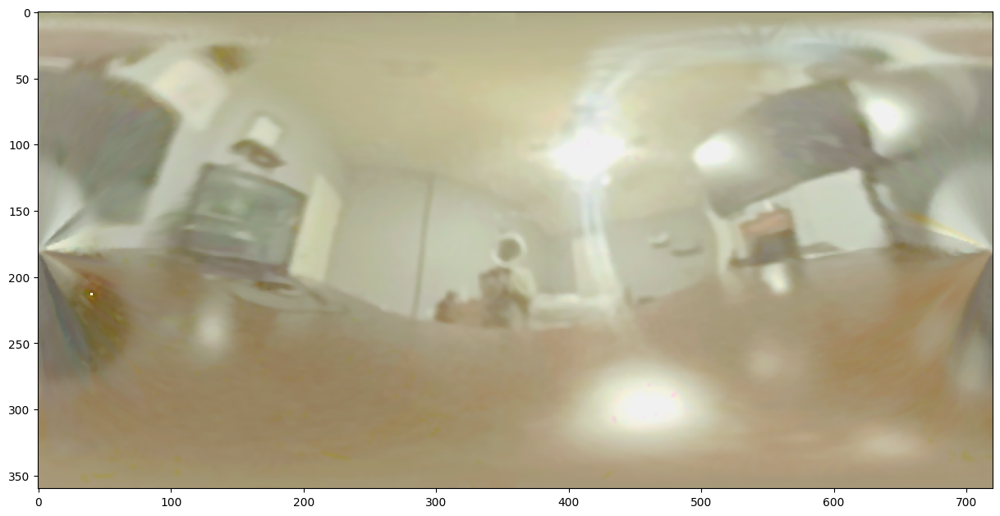

In [30]:
hdr_mirrorball_image = read_hdr_image('images/outputs/calib_hdr.hdr')
eq_image = panoramic_transform(hdr_mirrorball_image)

write_hdr_image(eq_image, 'images/outputs/equirectangular.hdr')

plt.figure(figsize=(15,15))
display_hdr_image(eq_image)


---

## Rendering synthetic objects into photographs 

Use Blender to render the scene with and with objects and obtain the mask image.  The code below should then load the images and create the final composite.

In [31]:
# Read the images that you produced using Blender.  Modify names as needed.
O = read_image('images/default_render.png')
E = read_image('images/plane_render.png')
M = read_image('images/default_render_mask.png')
M = M > 0.5
I = background_image
I = cv2.resize(I, (M.shape[1], M.shape[0]))

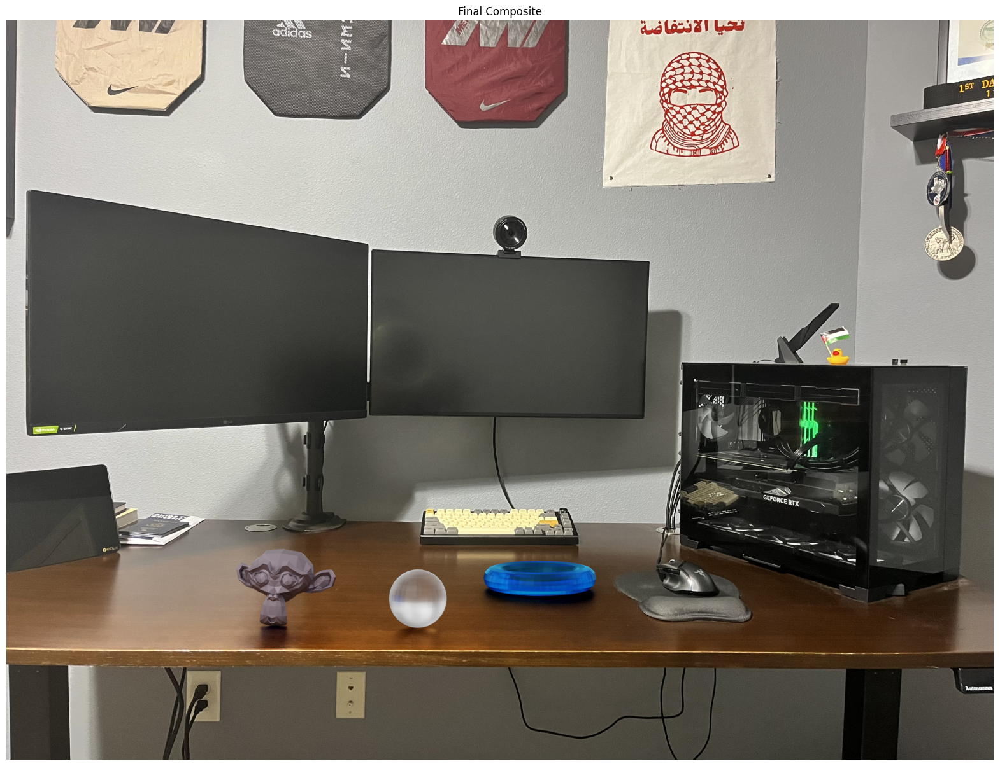

In [32]:
# TO DO: compute final composite
result = []


# Convert to float
M = M.astype(np.float32)
c=1.7

# Subtract plane to isolate object, then composite onto real background
result = M * O + (1-M) * I + (1-M)*(O - E)*c

# Clamp values to [0, 1]
result = np.clip(result, 0, 1)

# Show and save
plt.figure(figsize=(20, 20))
plt.imshow(result)
plt.axis('off')
plt.title("Final Composite")
plt.show()

write_image(result, 'images/outputs/final_composite.png')


## Bells & Whistles (Extra Points)

### Additional Image-Based Lighting Result 

In [33]:
# Read the images that you produced using Blender.  Modify names as needed.
O = read_image('images/Final_Render_3.png')
E = read_image('images/Final_Render_plane_2.png')
M = read_image('images/Final_Render_mask.png')
M = M > 0.5
I = background_image
I = cv2.resize(I, (M.shape[1], M.shape[0]))

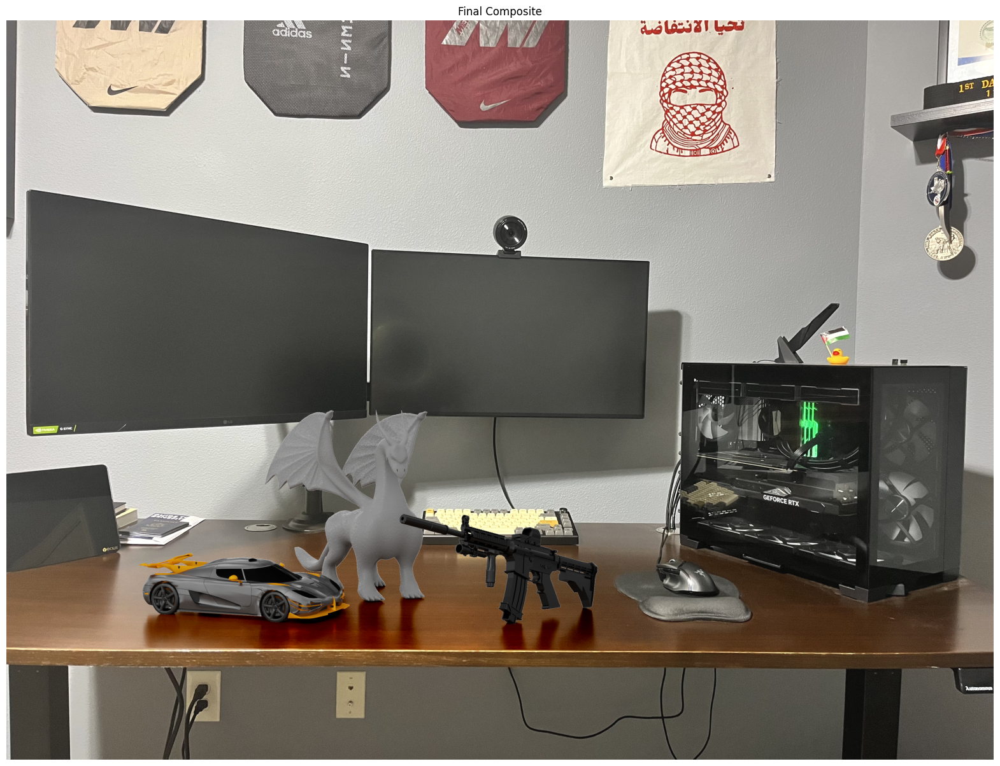

In [34]:
# TO DO: compute final composite
result = []


# Convert to float
M = M.astype(np.float32)
c=1


# Subtract plane to isolate object, then composite onto real background
result = M * O + (1-M) * I + (1-M)*(O - E)*c

# Clamp values to [0, 1]
result = np.clip(result, 0, 1)

# Show and save
plt.figure(figsize=(20, 20))
plt.imshow(result)
plt.axis('off')
plt.title("Final Composite")
plt.show()

write_image(result, 'images/outputs/final_composite.png')

---

In [35]:
# TODO: Replace this with your path and files

imdir = 'samples'
imfns = ['0024.jpg', '0060.jpg', '0120.jpg', '0205.jpg', '0553.jpg']
exposure_times = [1/24.0, 1/60.0, 1/120.0, 1/205.0, 1/553.0]
#My Images:
# imfns = ['IMG_30_cropped.jpg', 'IMG_60_cropped.jpg', 'IMG_120_cropped.jpg', 'IMG_166_cropped.jpg', 'IMG_412_cropped.jpg']
# exposure_times = [1/30.0, 1/60.0, 1/120.0, 1/166.0, 1/412.0]

ldr_images = []
for f in np.arange(len(imfns)):
  im = read_image(imdir + '/' + imfns[f])
  if f==0:
    imsize = int((im.shape[0] + im.shape[1])/2) # set width/height of ball images
    ldr_images = np.zeros((len(imfns), imsize, imsize, 3))
  ldr_images[f] = cv2.resize(im, (imsize, imsize))

background_image_file = imdir + '/' + 'empty.jpg'
background_image = read_image(background_image_file)


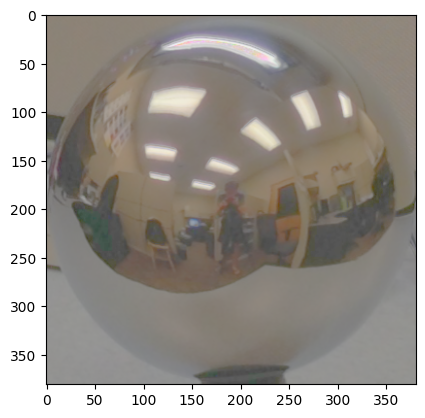

In [36]:
# get HDR image, log irradiance
weighted_hdr_image = make_hdr_weighted(ldr_images, exposure_times)

# write HDR image to directory
write_hdr_image(weighted_hdr_image, 'images/outputs/weighted_hdr_2.hdr')

# display HDR image
display_hdr_image(weighted_hdr_image)

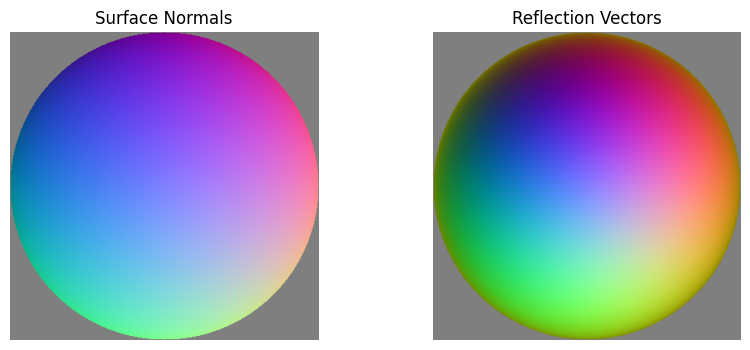

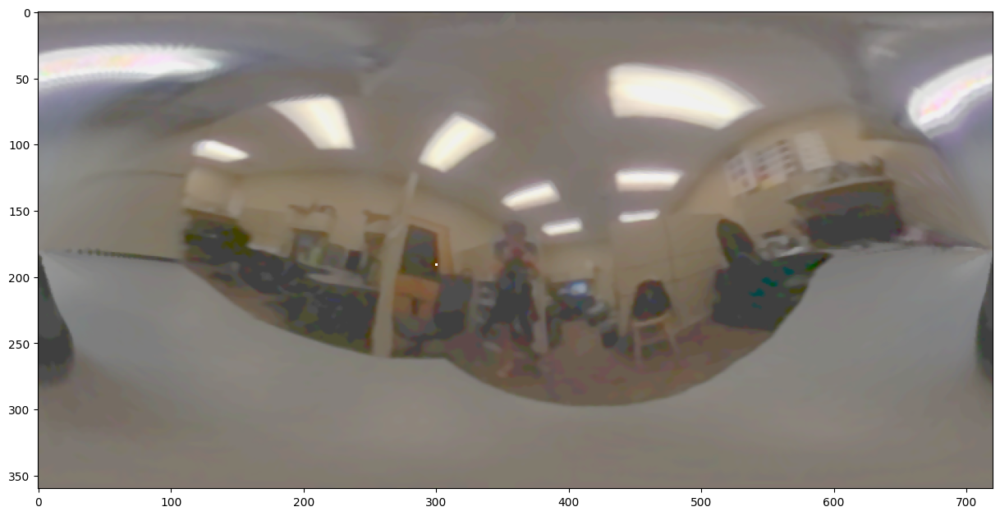

In [37]:
hdr_mirrorball_image = read_hdr_image('images/outputs/weighted_hdr_2.hdr')
eq_image = panoramic_transform(hdr_mirrorball_image)

write_hdr_image(eq_image, 'images/outputs/equirectangular_2.hdr')

plt.figure(figsize=(15,15))
display_hdr_image(eq_image)


In [38]:
# Read the images that you produced using Blender.  Modify names as needed.
O = read_image('images/render_result_5.png')
E = read_image('images/plane_5.png')
M = read_image('images/mask_5.png')
M = M > 0.5
I = background_image
I = cv2.resize(I, (M.shape[1], M.shape[0]))

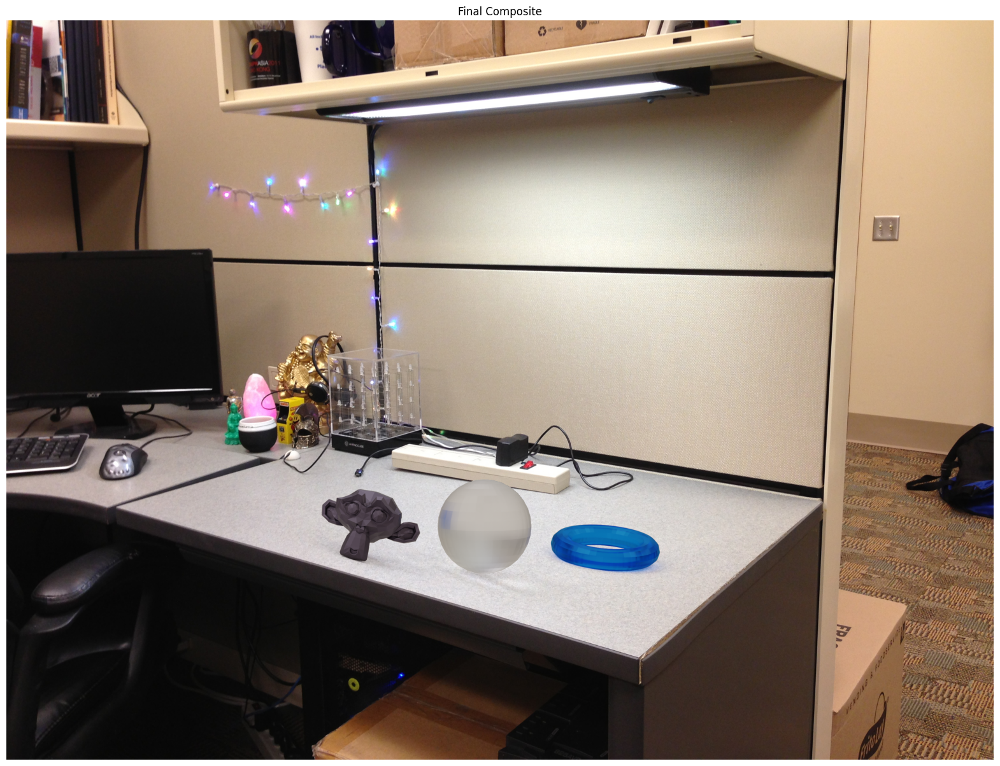

In [39]:
# TO DO: compute final composite
result = []


# Convert to float
M = M.astype(np.float32)
c=1


# Subtract plane to isolate object, then composite onto real background
result = M * O + (1-M) * I + (1-M)*(O - E)*c

# Clamp values to [0, 1]
result = np.clip(result, 0, 1)

# Show and save
plt.figure(figsize=(20, 20))
plt.imshow(result)
plt.axis('off')
plt.title("Final Composite")
plt.show()

write_image(result, 'images/outputs/final_composite.png')


## Other panoramic transformations 


## Angular Mapping

In [40]:
def generate_angular_map_from_mirrorball(hdr_image, out_res=512):
    """
    Generate an angular environment map from a mirror ball HDR image.
    
    Args:
        hdr_image: H x W x 3 HDR mirror ball image (assumed square and centered).
        out_res: Output resolution of the angular map (square output).
    
    Returns:
        angular_map: A square (out_res x out_res x 3) angular HDR image.
    """
    H, W, C = hdr_image.shape
    assert H == W and C == 3
    cx = cy = H // 2
    radius = H / 2

    # Step 1: compute normals for the mirror ball
    y, x = np.meshgrid(np.arange(H), np.arange(W), indexing='ij')
    nx = (x - cx) / radius
    ny = (y - cy) / radius
    mask = nx**2 + ny**2 <= 1
    nz = np.sqrt(np.clip(1 - nx**2 - ny**2, 0, 1))
    N = np.stack([nx, ny, nz], axis=-1)
    N[~mask] = 0

    # Step 2: compute reflection vectors R = V - 2 * dot(V,N) * N where V = [0, 0, -1]
    V = np.array([0, 0, -1])
    dotVN = np.sum(N * V, axis=-1, keepdims=True)
    R = V - 2 * dotVN * N
    R[~mask] = 0

    # Step 3: convert reflection vectors to angular coordinates
    rv_x, rv_y, rv_z = R[..., 0], R[..., 1], R[..., 2]
    theta = np.arccos(np.clip(rv_z, -1, 1))  # angle from Z axis
    phi = np.arctan2(rv_y, rv_x)  # azimuth
    phi[phi < 0] += 2 * np.pi

    # Normalize to [0, 1] range for remapping
    theta /= np.pi
    phi /= 2 * np.pi

    # Step 4: flatten input image and coordinates
    spherical_coords = np.stack([phi, theta], axis=-1).reshape(-1, 2)
    image_vals = hdr_image.reshape(-1, 3)
    valid = mask.flatten()

    # Step 5: build output grid
    u, v = np.meshgrid(np.linspace(0, 1, out_res), np.linspace(0, 1, out_res))
    target_coords = np.stack([u, v], axis=-1).reshape(-1, 2)

    # Step 6: interpolate for each channel
    angular_map = np.zeros((out_res * out_res, 3), dtype=np.float32)
    for c in range(3):
        interpolated = griddata(
            spherical_coords[valid],
            np.log(image_vals[valid, c] + 1e-6),  # log-space interpolation
            target_coords,
            method='linear',
            fill_value=np.nan
        )
        angular_map[:, c] = np.exp(interpolated)

    angular_map = angular_map.reshape((out_res, out_res, 3))

    # Optional: clean up any remaining NaNs
    nan_mask = np.isnan(angular_map)
    if np.any(nan_mask):
        mean_val = np.nanmean(angular_map)
        angular_map[nan_mask] = mean_val

    # Optional: median filter to remove speckles
    for c in range(3):
        angular_map[:, :, c] = median_filter(angular_map[:, :, c], size=3)

    return angular_map.astype(np.float32)


In [41]:
hdr_image = read_hdr_image("images/outputs/calib_hdr.hdr")
angular_map = generate_angular_map_from_mirrorball(hdr_image)
write_hdr_image(angular_map, "images/outputs/angular_map.hdr")

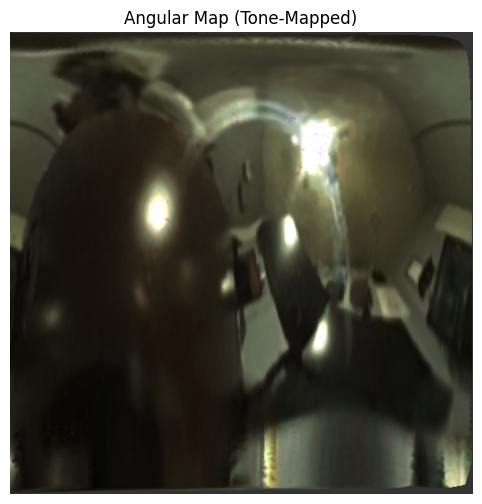

In [42]:
import matplotlib.pyplot as plt

# Normalize for display (optional gamma can also help)
display_img = angular_map / (angular_map.max() + 1e-6)

plt.figure(figsize=(12, 6))
plt.imshow(display_img)
plt.title("Angular Map (Tone-Mapped)")
plt.axis('off')
plt.show()